# 2023-03-27

## 2023년 봄학기 캡스톤디자인 모델 파트 개발

## 프로젝트 개요

1. 프로젝트 주제 : AI를 활용한 사용자별 맞춤형 운동 자세 교정 어플리케이션
2. 프로젝트 주안점 : 사용자 맞춤형 트레이닝 코칭, 정보 공유를 위한 커뮤니티, 간결한 UI

<br>

## 프로젝트 워크플로우 model ver.

- 데이터 수집
- 데이터 전처리
- 모델 설계
- 모델 학습
- 모델 저장

## 1. 하나의 동영상에서 균등한 간격으로 n개의 이미지를 추출하기

1. 동영상을 읽어옵니다.
2. 전체 동영상의 길이를 계산합니다.
3. 동영상 길이를 n으로 나누어 간격을 계산합니다.
4. 첫번째 이미지를 추출합니다.
5. 계산된 간격에 따라 동영상에서 해당하는 위치에 있는 이미지를 추출합니다.
6. 추출한 이미지를 저장합니다.
7. 4~6번을 n번 반복합니다.

In [25]:
# step 1. 이미지 균등하게 추출하는 함수 from chatGPT_3.5

import cv2

def extract_frames(video_path, n):
    # 동영상 열기
    cap = cv2.VideoCapture(video_path)

    # 전체 동영상 길이 계산
    length = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    # 간격 계산
    interval = length // n

    frames = []
    for i in range(n):
        # 이미지 추출
        cap.set(cv2.CAP_PROP_POS_FRAMES, i * interval)
        ret, frame = cap.read()
        
        if ret:
            # 이미지 리스트에 저장
            frames.append(frame)
        else:
            break

    cap.release()
    return frames

In [26]:
video_path = './data/squat_full/0/cut/man_squat_0_rep2.mp4'

images = extract_frames(video_path, 20)

In [27]:
print(f'추출한 이미지 개수 : {len(images)}')
print(f'image shape : {images[1].shape}')

추출한 이미지 개수 : 16
image shape : (1280, 720, 3)


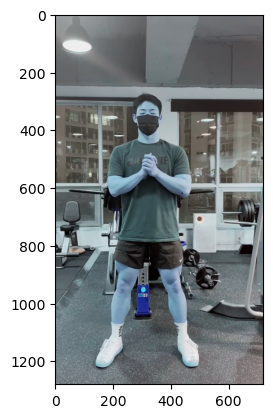

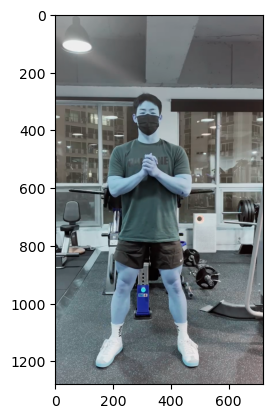

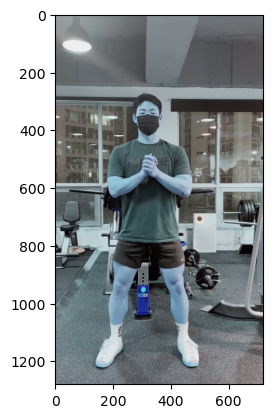

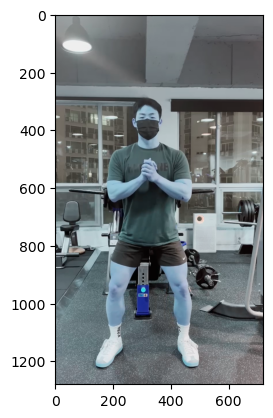

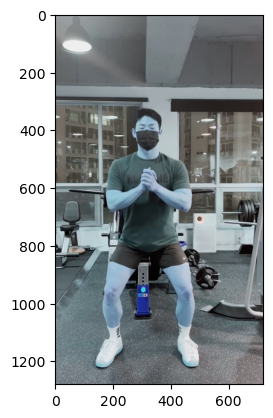

...

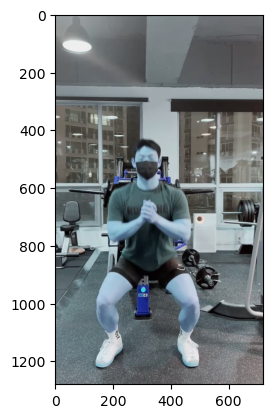

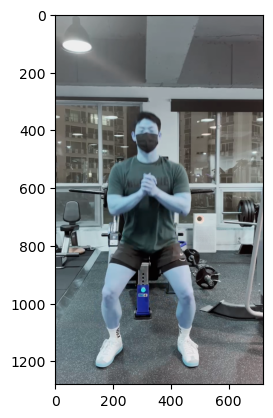

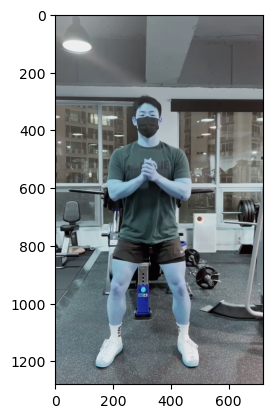

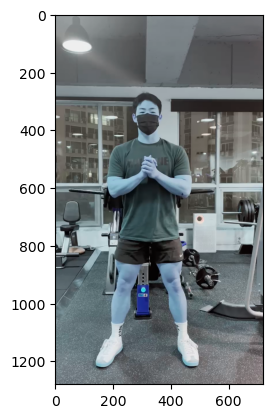

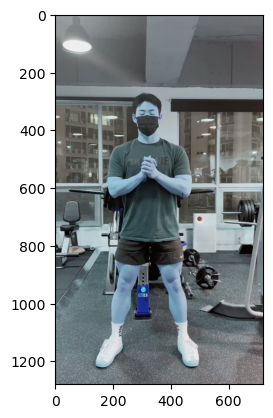

In [28]:
# 추출한 이미지 확인하기

import matplotlib.pyplot as plt

for i in range(len(images)):
    plt.imshow(images[i])
    plt.show()

**뭔가 결과가 이상하다...**
<br>
직접 코드 작성하기
<br><br><br>

In [113]:
# 위 함수 수정

import cv2

def extract_frames2(video_path, n):
    # 동영상 열기
    cap = cv2.VideoCapture(video_path)

    # 전체 동영상 길이 계산
    length = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(length)

    # 간격 계산
    if n == 1:
        interval = length
    else:
        interval = length / (n-1)

    frames = []
    for i in range(n):
        # 이미지 추출
        pos = int(i * interval)
        cap.set(cv2.CAP_PROP_POS_FRAMES, pos)
        ret, frame = cap.read()
        
        if ret:
            # 이미지 저장
            frames.append(frame)
        else:
            break

    # 이미지 추출 간격을 더 조정하여 부족한 이미지를 추출함
    while len(frames) < n:
        interval -= 0.1
        for i in range(n - len(frames)):
            pos = int((i * interval))
            cap.set(cv2.CAP_PROP_POS_FRAMES, pos)
            ret, frame = cap.read()
            if ret:
                frames.append(frame)
            else:
                break

    cap.release()
    return frames


In [114]:
video_path = './data/squat_full/0/cut/man_squat_0_rep2.mp4'

images2 = extract_frames2(video_path, 16)

101


In [115]:
print(f'추출한 이미지 개수 : {len(images2)}')
print(f'image shape : {images2[1].shape}')

추출한 이미지 개수 : 16
image shape : (1280, 720, 3)


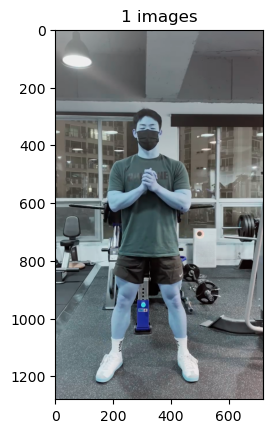

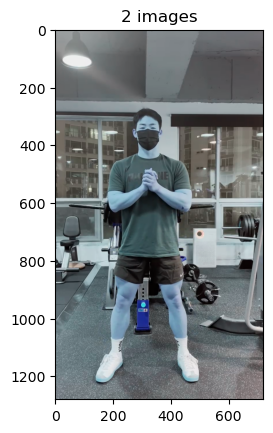

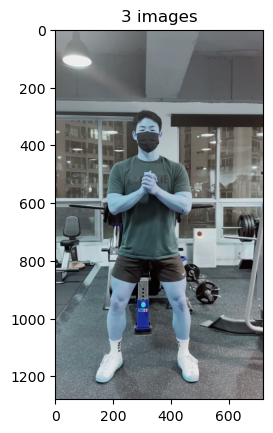

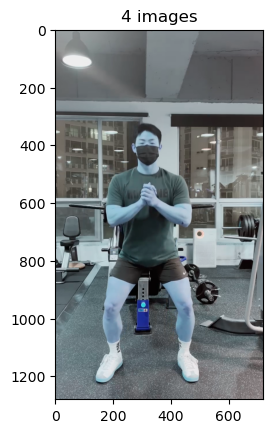

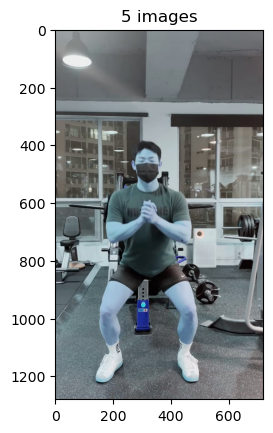

...

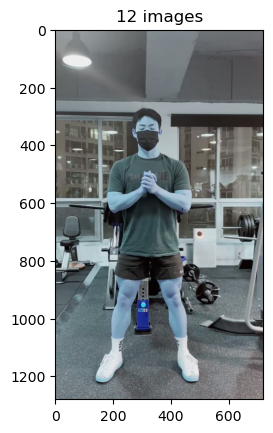

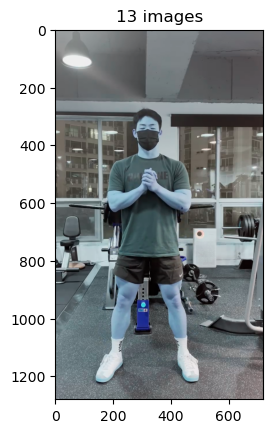

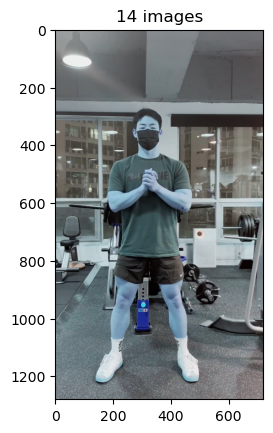

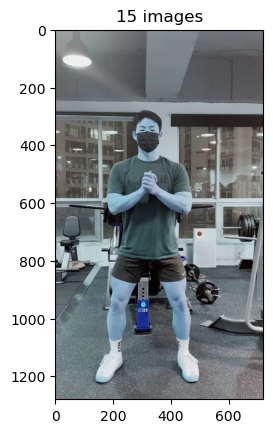

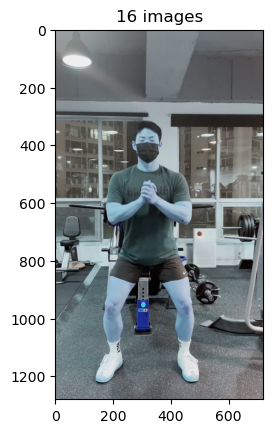

In [91]:
# 추출한 이미지 확인하기

import matplotlib.pyplot as plt

for i in range(len(images2)):
    plt.title(f'{i+1} images')
    plt.imshow(images2[i])
    plt.show()

<br>

**이것도 이상하다ㅠㅠ 동영상을 불러오는 속도와 저장하는 속도에 차이가 있어서 발생하는 문제가 맞는 것 같다.**

<br><br>

### 다른 방법

1. 동영상의 모든 프레임을 리스트 all_list에 일단 저장
2. 건너뛸 간격을 계산해서 이미지를 추출
3. 추출한 이미지를 로컬에 저장

In [119]:
# 1. 동영상의 모든 프레임을 리스트에 저장

import os

video_path = './data/squat_full/0/cut/man_squat_0_rep1.mp4'
all_list = []

video = cv2.VideoCapture(video_path)
count_frame = int(video.get(cv2.CAP_PROP_FRAME_COUNT)) # 영상의 프레임 개수 (= 추출 가능한 최대 이미지 개수)
fps = video.get(cv2.CAP_PROP_FPS)

while(video.isOpened()):
    ret, frame = video.read()
    if not ret:
        print(ret, count)
        break

    if ret:
        all_list.append(frame)

video.release()

print(f'end, {len(all_list)} videos and {count_frame} images were saved')

False 85
end, 85 videos and 85 images were saved


(-0.5, 719.5, 1279.5, -0.5)

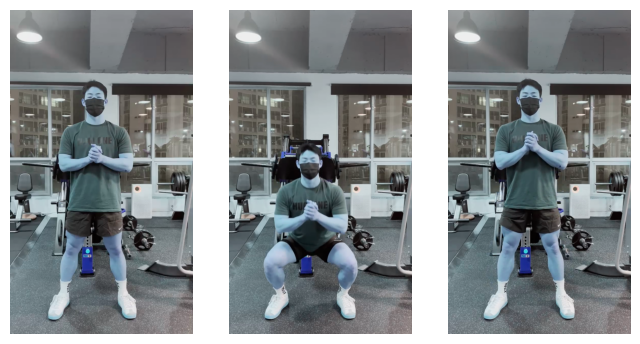

In [147]:
# 확인.

fig, ax = plt.subplots(1,3, figsize=(8, 5))

ax[0].imshow(all_list[0])
ax[1].imshow(all_list[count_frame//2])
ax[2].imshow(all_list[count_frame-1])

# for i in range(3):
#     globals()[f'ax[{i}]'].axis()

ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')

In [173]:
# 2. 건너뛸 간격 계산해서 이미지 저장하기

n = 16 # 추출할 이미지의 개수

print(f'동영상의 전체 이미지 개수 : {count_frame}, {len(all_list)}')
print(f'추출할 이미지의 개수 n : {n}')

skip = count_frame / n # 건너뛸 개수. float 타입으로 설정.
print(f'skip = {skip}')

동영상의 전체 이미지 개수 : 85, 85
추출할 이미지의 개수 n : 16
skip = 5.3125


In [174]:
save_images = [] # n개의 이미지를 저장할 리스트
cnt = 0 # 이미지 카운팅

for i in range(count_frame):
    if i == np.floor(skip*cnt): # 해당 번째 이미지만 리스트에 추가한다.
        print(f'skip*cnt = {i}')
        cnt += 1
        save_images.append(all_list[i])

skip*cnt = 0
skip*cnt = 5
skip*cnt = 10
skip*cnt = 15
skip*cnt = 21
skip*cnt = 26
skip*cnt = 31
skip*cnt = 37
skip*cnt = 42
skip*cnt = 47
skip*cnt = 53
skip*cnt = 58
skip*cnt = 63
skip*cnt = 69
skip*cnt = 74
skip*cnt = 79


In [175]:
len(save_images)

16

In [176]:
save_images[0].shape

(1280, 720, 3)

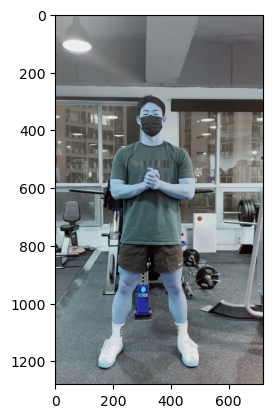

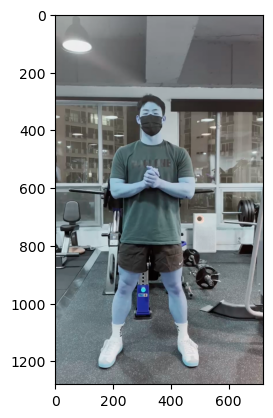

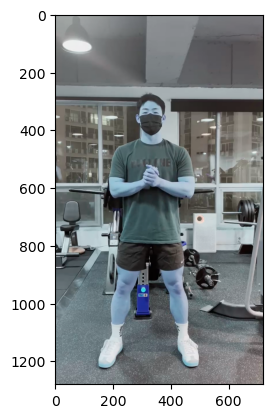

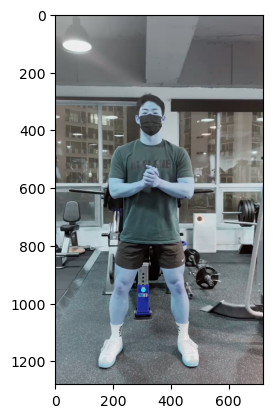

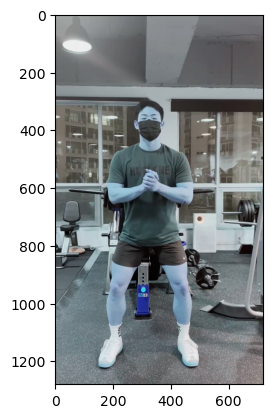

...

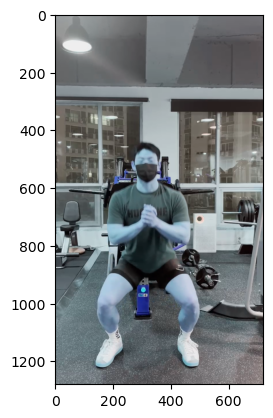

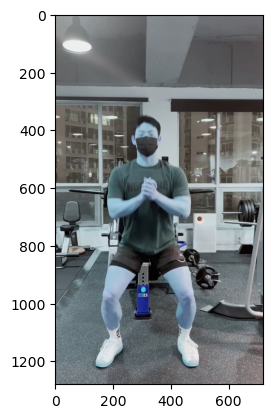

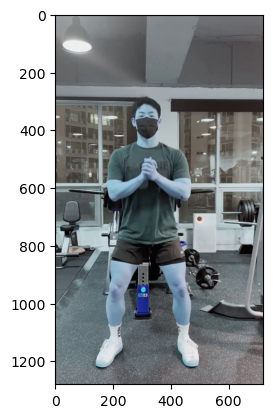

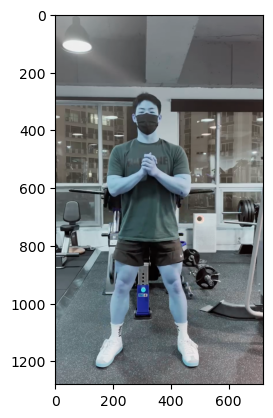

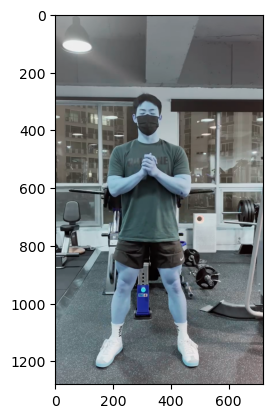

In [177]:
for i in range(len(save_images)):
    plt.imshow(save_images[i])
    plt.show()

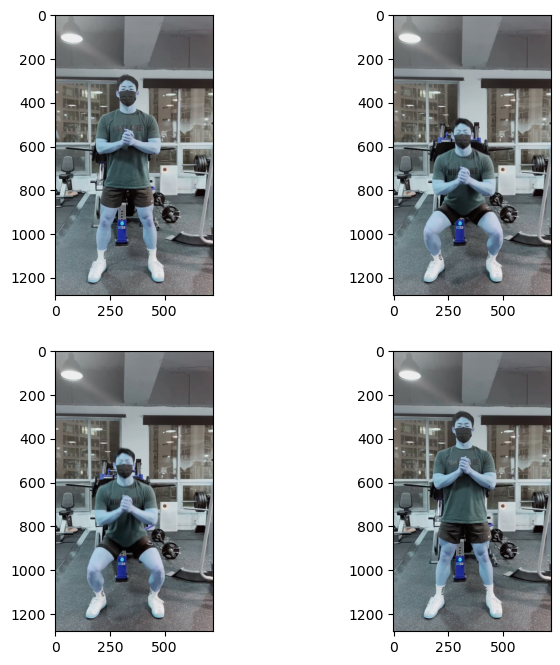

In [187]:
# 확인.

fig, ax = plt.subplots(2,2, figsize=(8, 8))

ax[0][0].imshow(save_images[3])
ax[0][1].imshow(save_images[7])
ax[1][0].imshow(save_images[11])
ax[1][1].imshow(save_images[15])

In [ ]:
for i in range(n):
    globals()[f'ax[i]']

In [189]:
# step 2. 추출한 이미지 리스트에서 저장하기

save_derectory = './data/images/sample/' # 저장할 경로

for i in range(n):
    path = save_derectory + f'squat_{str(i)}.jpg'
    cv2.imwrite(path, save_images[i])

<br><br>


### 결과
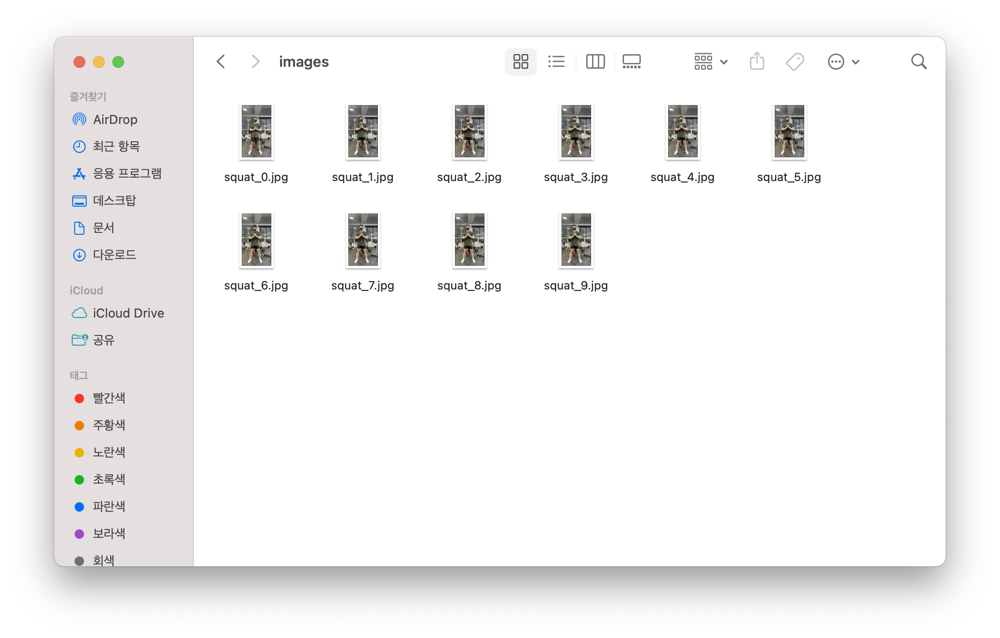

### 위 내용 하나의 함수로 구현

In [1]:
import cv2
import os
import numpy as np

In [2]:
def video_to_images(N, video_PATH, save_PATH) :
    
    # 1. 동영상의 모든 프레임을 리스트(temp_list)에 저장하기
    temp_list = []
    video = cv2.VideoCapture(video_PATH)
    fps = video.get(cv2.CAP_PROP_FPS)
    while(video.isOpened()):
        ret, frame = video.read()
        if not ret:
            break

        if ret:
            temp_list.append(frame)

    video.release()
    print(f'1. {len(temp_list)} images were saved in list')
    
    # 2. 건너 뛸 간격(skip)을 계산해서 해당 경로에 저장하기
    skip = len(temp_list) / N
    cnt = 0
    for i in range(len(temp_list)):
        if i == np.floor(skip*cnt):
            if cnt < 10 :
                filename = f'exercise_0{cnt}.jpg'
            else:
                filename = f'exercise_{cnt}.jpg'
            cv2.imwrite(save_PATH + filename, temp_list[i])
            cnt += 1
    print('end')

In [24]:
# # 각 랩스별로 폴더를 생성하여 저장하기

# path1 = './data/total/1_video/' # 동영상이 저장된 경로
# path2 = './data/images/squat_images/' # 이미지를 저장할 경로

# video_list = sorted(os.listdir(path1))

# for i in range(len(video_list)):
#     if i<10 :
#         make_folder_path = path2 + f'0{str(i)}/'
#     else :
#         make_folder_path = path2 + f'{str(i)}/'
    
#     # 각 랩스별로 폴더 생성
#     os.mkdir(make_folder_path)
    
#     # 동영상을 이미지로 저장
#     video_to_images(15, path1 + video_list[i], make_folder_path)
    
# print('진짜 끝!')

1. 137 images were saved in list
end
1. 104 images were saved in list
end
1. 120 images were saved in list
end
1. 109 images were saved in list
end
1. 130 images were saved in list
end
1. 85 images were saved in list
end
1. 83 images were saved in list
end
1. 80 images were saved in list
end
1. 69 images were saved in list
end
1. 75 images were saved in list
end
1. 69 images were saved in list
end
1. 78 images were saved in list
end
1. 73 images were saved in list
end
1. 72 images were saved in list
end
1. 69 images were saved in list
end
진짜 끝!


In [3]:
path1 = './data/total_0513/1_video/0517/' # 동영상이 저장된 경로
path2 = './data/total_0513/2_3_images/' # 이미지를 저장할 경로

video_list = []

for i in sorted(os.listdir(path1)):
    if i == '.DS_Store':
        pass
    else:
        video_list.append(i)
        
start = 123 # 넘버링 시작번호

for i in range(start, start + len(video_list)):
    if i<10 :
        make_folder_path = path2 + f'00{str(i)}/'
    elif i<100 :
        make_folder_path = path2 + f'0{str(i)}/'
    else :
        make_folder_path = path2 + f'{str(i)}/'
        
    # 각 랩스별로 폴더 생성
    os.mkdir(make_folder_path)
    
    # 동영상을 이미지로 저장
    video_to_images(15, path1 + video_list[i-start], make_folder_path)
    
print('진짜 끝!')

1. 160 images were saved in list
end
1. 66 images were saved in list
end
1. 50 images were saved in list
end


[h264 @ 0x10c042590] mmco: unref short failure


1. 75 images were saved in list
end
1. 31 images were saved in list
end
1. 45 images were saved in list
end
1. 105 images were saved in list
end
1. 105 images were saved in list
end
1. 78 images were saved in list
end
1. 61 images were saved in list
end
진짜 끝!


In [3]:
# video_to_images(15, './data/squat_full/0/cut/dasol_squat_0_rep6.mov', './data/images/sample2/')

1. 102 images were saved in list
end


In [15]:
# video_to_images(15, './data/squat_full/0/cut/man_squat_0_rep1.mp4', './data/images/sample1/')

1. 85 images were saved in list
end


In [36]:
# import os

# path1 = './data/total/2_image/'

# video_list = sorted(os.listdir(path1))

# for i in video_list:
#     old_name = path1 + i + '/'
#     new_name = path1 + f'0{i}/'
    
#     os.rename(old_name, new_name)
#     print(old_name, new_name)

./data/total/2_image/00/ ./data/total/2_image/000/
./data/total/2_image/01/ ./data/total/2_image/001/
./data/total/2_image/02/ ./data/total/2_image/002/
./data/total/2_image/03/ ./data/total/2_image/003/
./data/total/2_image/04/ ./data/total/2_image/004/
./data/total/2_image/05/ ./data/total/2_image/005/
./data/total/2_image/06/ ./data/total/2_image/006/
./data/total/2_image/07/ ./data/total/2_image/007/
./data/total/2_image/08/ ./data/total/2_image/008/
./data/total/2_image/09/ ./data/total/2_image/009/
./data/total/2_image/10/ ./data/total/2_image/010/
./data/total/2_image/11/ ./data/total/2_image/011/
./data/total/2_image/12/ ./data/total/2_image/012/
./data/total/2_image/13/ ./data/total/2_image/013/
./data/total/2_image/14/ ./data/total/2_image/014/
./data/total/2_image/15/ ./data/total/2_image/015/
./data/total/2_image/16/ ./data/total/2_image/016/
./data/total/2_image/17/ ./data/total/2_image/017/
./data/total/2_image/18/ ./data/total/2_image/018/
./data/total/2_image/19/ ./data

In [30]:
# path1 = './data/total/1_1_video/'

# for i in range(34, 75):
#     old_name = path1 + video_list[i-34]
# #     print(old_name)
#     if i < 10:
#         new_name = path1 + f'00{i}.mp4'
#     elif i < 100:
#         new_name = path1 + f'0{i}.mp4'
#     else:
#         new_name = path1 + f'{i}.mp4'
        
#     print(new_name)
#     os.rename(old_name, new_name)
    

./data/total/1_1_video/034.mp4
./data/total/1_1_video/035.mp4
./data/total/1_1_video/036.mp4
./data/total/1_1_video/037.mp4
./data/total/1_1_video/038.mp4
./data/total/1_1_video/039.mp4
./data/total/1_1_video/040.mp4
./data/total/1_1_video/041.mp4
./data/total/1_1_video/042.mp4
./data/total/1_1_video/043.mp4
./data/total/1_1_video/044.mp4
./data/total/1_1_video/045.mp4
./data/total/1_1_video/046.mp4
./data/total/1_1_video/047.mp4
./data/total/1_1_video/048.mp4
./data/total/1_1_video/049.mp4
./data/total/1_1_video/050.mp4
./data/total/1_1_video/051.mp4
./data/total/1_1_video/052.mp4
./data/total/1_1_video/053.mp4
./data/total/1_1_video/054.mp4
./data/total/1_1_video/055.mp4
./data/total/1_1_video/056.mp4
./data/total/1_1_video/057.mp4
./data/total/1_1_video/058.mp4
./data/total/1_1_video/059.mp4
./data/total/1_1_video/060.mp4
./data/total/1_1_video/061.mp4
./data/total/1_1_video/062.mp4
./data/total/1_1_video/063.mp4
./data/total/1_1_video/064.mp4
./data/total/1_1_video/065.mp4
./data/t

## (추가) 유튜브에서 동영상 가져와서 이미지로 변환하여 저장하기

In [31]:
import pafy
from pytube import YouTube

In [47]:
# 1. 유튜브 영상 불러오기

video_url = 'https://www.youtube.com/watch?v=124EvTRSLo8'
yt = YouTube(video_url)

yt.title

'776BC MOTION - SQUAT TECHNIQUE - FRONT VIEW'

In [48]:
# 2. 유튜브 영상 로컬에 다운로드

yt_video = yt.streams.filter(res='720p')

if yt_video.count==0: #no movie with filtering condition
    quit()
else: #if movie is exist
    #download first stream
    print(yt_video[0])
    movie_file = yt_video[0].download('./data/squat_full/youtube')

<Stream: itag="22" mime_type="video/mp4" res="720p" fps="25fps" vcodec="avc1.64001F" acodec="mp4a.40.2" progressive="True" type="video">


In [70]:
# 3. 저장된 각 랩스별로 폴더를 생성하여 저장하기

path1 = './data/squat_full/0/new_cut/' # 동영상이 저장된 경로
path2 = './data/images/squat_images/' # 이미지를 저장할 경로

video_list = sorted(os.listdir(path1))

for i in range(15, 15+len(video_list)):
    print(video_list[i-15])
    if i<10 :
        make_folder_path = path2 + f'0{str(i)}/'
    else :
        make_folder_path = path2 + f'{str(i)}/'
    
    # 각 랩스별로 폴더 생성
    os.mkdir(make_folder_path)
    
    # 동영상을 이미지로 저장
    video_to_images(15, path1 + video_list[i-15], make_folder_path)
    
print('\n진짜 끝!')

man2_squat_0_rep1.mp4
1. 75 images were saved in list
end
man2_squat_0_rep2.mp4
1. 87 images were saved in list
end
man2_squat_0_rep3.mp4
1. 81 images were saved in list
end
man2_squat_0_rep4.mp4
1. 80 images were saved in list
end
man2_squat_0_rep5.mp4
1. 98 images were saved in list
end
man3_squat_0_rep1.mp4
1. 133 images were saved in list
end
man3_squat_0_rep2.mp4
1. 123 images were saved in list
end
man3_squat_0_rep3.mp4
1. 121 images were saved in list
end
man4_squat_0_rep1.mp4
1. 91 images were saved in list
end
man5_squat_0_rep1.mp4
1. 71 images were saved in list
end
man5_squat_0_rep2.mp4
1. 67 images were saved in list
end
woman1_squat_0_rep1.mp4
1. 117 images were saved in list
end
woman1_squat_0_rep2.mp4
1. 127 images were saved in list
end
woman2_squat_0_rep1.mp4
1. 68 images were saved in list
end
woman2_squat_0_rep2.mp4
1. 62 images were saved in list
end
woman3_squat_0_rep1.mp4
1. 106 images were saved in list
end
woman_squat_0_rep3.mp4
1. 129 images were saved in list


### 유튜브 영상은 노이즈가 많으므로 눈으로 한번 확인해서 다듬는 과정이 필요하다

Original img shape = (720, 1280, 3)
Cropped img shape = (720, 370, 3)


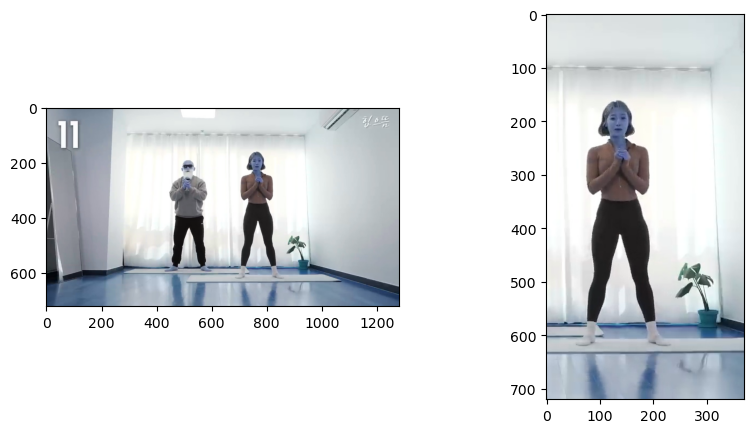

In [121]:
# 4. 이미지 노이즈 제거

import matplotlib.pyplot as plt

img1 = cv2.imread('./data/images/squat_images/28/exercise_00.jpg')
print(f'Original img shape = {img1.shape}')

imgCut = img1[0:720, 630:1000]
print(f'Cropped img shape = {imgCut.shape}')

fig, ax = plt.subplots(1,2, figsize=(10, 5))
ax[0].imshow(img1)
ax[1].imshow(imgCut)

plt.show()

In [122]:
imgPath = './data/images/squat_images/29/'
img_list = sorted(os.listdir(imgPath))

for i in range(len(img_list)):
    path = imgPath + img_list[i]
    print(path)
    img1 = cv2.imread(path)
    imgCut = img1[0:720, 630:1000]
    save_path = f'./data/images/squat_images/29_1/{img_list[i]}'
    cv2.imwrite(save_path, imgCut)

./data/images/squat_images/29/exercise_00.jpg
./data/images/squat_images/29/exercise_01.jpg
./data/images/squat_images/29/exercise_02.jpg
./data/images/squat_images/29/exercise_03.jpg
./data/images/squat_images/29/exercise_04.jpg
./data/images/squat_images/29/exercise_05.jpg
./data/images/squat_images/29/exercise_06.jpg
./data/images/squat_images/29/exercise_07.jpg
./data/images/squat_images/29/exercise_08.jpg
./data/images/squat_images/29/exercise_09.jpg
./data/images/squat_images/29/exercise_10.jpg
./data/images/squat_images/29/exercise_11.jpg
./data/images/squat_images/29/exercise_12.jpg
./data/images/squat_images/29/exercise_13.jpg
./data/images/squat_images/29/exercise_14.jpg


In [119]:
imgPath = './data/images/squat_images/29/'
img_list = sorted(os.listdir(imgPath))
img_list

['exercise_00.jpg',
 'exercise_01.jpg',
 'exercise_02.jpg',
 'exercise_03.jpg',
 'exercise_04.jpg',
 'exercise_05.jpg',
 'exercise_06.jpg',
 'exercise_07.jpg',
 'exercise_08.jpg',
 'exercise_09.jpg',
 'exercise_10.jpg',
 'exercise_11.jpg',
 'exercise_12.jpg',
 'exercise_13.jpg',
 'exercise_14.jpg']

In [114]:
for i in range(len(a)):
    if a[i][-3:] == 'jpg':
        print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
16


In [127]:
img1 = cv2.imread('./data/images/squat_images/28/exercise_00.jpg')
img1[0]

array([[217, 222, 221],
       [218, 223, 222],
       [218, 223, 222],
       ...,
       [172, 181, 184],
       [172, 181, 184],
       [172, 181, 184]], dtype=uint8)

In [128]:
img1

array([[[217, 222, 221],
        [218, 223, 222],
        [218, 223, 222],
        ...,
        [172, 181, 184],
        [172, 181, 184],
        [172, 181, 184]],

       [[217, 222, 221],
        [218, 223, 222],
        [218, 223, 222],
        ...,
        [172, 181, 184],
        [172, 181, 184],
        [172, 181, 184]],

       [[217, 222, 221],
        [218, 223, 222],
        [218, 223, 222],
        ...,
        [172, 181, 184],
        [172, 181, 184],
        [172, 181, 184]],

       ...,

       [[186, 197, 211],
        [187, 198, 212],
        [165, 176, 190],
        ...,
        [ 68,  93, 127],
        [ 68,  93, 127],
        [ 68,  93, 127]],

       [[186, 197, 211],
        [188, 199, 213],
        [166, 177, 191],
        ...,
        [ 67,  92, 126],
        [ 68,  93, 127],
        [ 68,  93, 127]],

       [[186, 197, 211],
        [189, 200, 214],
        [167, 178, 192],
        ...,
        [ 68,  93, 127],
        [ 68,  93, 127],
        [ 68,  93, 127]]